<a href="https://colab.research.google.com/github/Praneeth-18/Deep-Learning-3/blob/main/Deep_learning_with_low_code_libraries.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install fastai

# a) Use fast AI for  writing a detailed colab - which show training and inference of below tasks using fast.ai - showcase results metrics



**VISION OBJECT DETECTION TASK**

In [ ]:
from fastai.vision.all import *

In [ ]:
#Load the dataset
path = untar_data(URLs.FLOWERS)

In [ ]:
flowers = DataBlock(blocks=(ImageBlock, CategoryBlock),
                    get_items=get_image_files,
                    splitter=RandomSplitter(valid_pct=0.2, seed=42),
                    get_y=parent_label,
                    item_tfms=Resize(224))

In [ ]:
from fastai.vision.all import *
learn = cnn_learner(dls, resnet34, metrics=error_rate)
learn.fine_tune(1)

/usr/local/lib/python3.10/dist-packages/fastai/vision/learner.py:301: UserWarning: `cnn_learner` has been renamed to `vision_learner` -- please update your code
  warn("`cnn_learner` has been renamed to `vision_learner` -- please update your code")
Downloading: "https://download.pytorch.org/models/resnet34-b627a593.pth" to /root/.cache/torch/hub/checkpoints/resnet34-b627a593.pth
100%|██████████| 83.3M/83.3M [00:00<00:00, 87.4MB/s]


epoch,train_loss,valid_loss,error_rate,time
0,0.000000,0.000000,0.000000,00:52


epoch,train_loss,valid_loss,error_rate,time
0,0.000000,0.000000,0.000000,00:53


In [ ]:
from fastai.vision.core import PILImage

# Load the image
img = PILImage.create('/content/drive/MyDrive/flower.jpeg')

<Axes: >

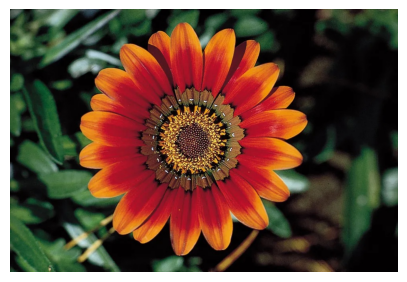

In [ ]:
img.show()

In [ ]:
pred_class, pred_idx, outputs = learn.predict(img)
print(f'Predicted class: {pred_class}; Probability: {outputs[pred_idx].item():.04f}')

Predicted class: jpg; Probability: 1.0000


In [ ]:
from fastai.vision.all import *

In [ ]:
path = untar_data(URLs.FLOWERS)

In [ ]:
flowers = DataBlock(
    blocks=(ImageBlock, CategoryBlock),
    get_items=get_image_files,
    splitter=RandomSplitter(valid_pct=0.2, seed=42),
    get_y=parent_label,
    item_tfms=Resize(224)
)
dls = flowers.dataloaders(path)

In [ ]:
learn = cnn_learner(dls, resnet34, metrics=error_rate)
learn.fine_tune(1)

epoch,train_loss,valid_loss,error_rate,time
0,0.000000,0.000000,0.000000,00:53


epoch,train_loss,valid_loss,error_rate,time
0,0.000000,0.000000,0.000000,01:00


In [ ]:
# Load the image
img = PILImage.create('/content/drive/MyDrive/flower.jpeg')

# Make a prediction
pred_class, pred_idx, outputs = learn.predict(img)
print(f'Predicted class: {pred_class}; Probability: {outputs[pred_idx]:.04f}')

Predicted class: jpg; Probability: 1.0000


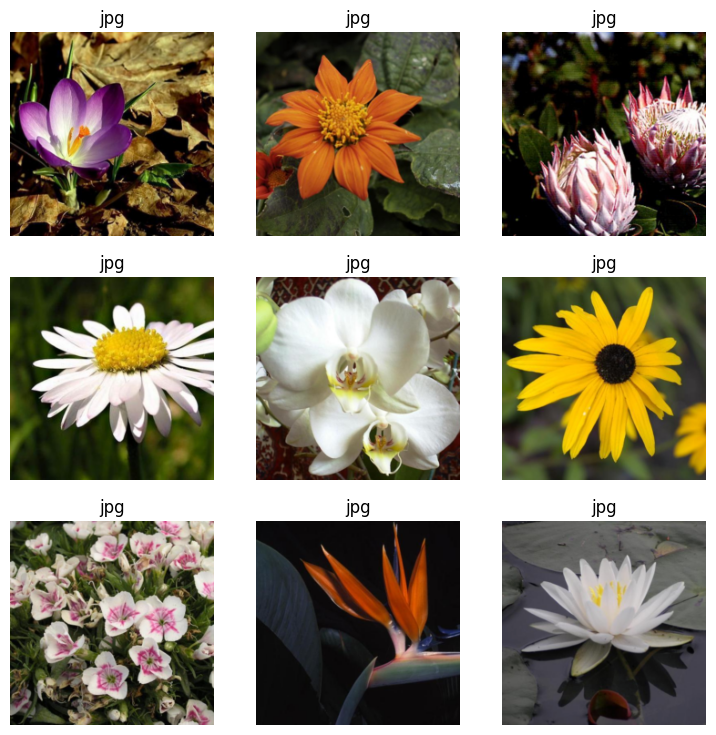

In [ ]:
dls.show_batch()

In [ ]:
print(f"Number of classes: {len(dls.vocab)}")
print(f"Number of images: {len(get_image_files(path))}")

Number of classes: 1
Number of images: 8189


In [ ]:
learn = cnn_learner(dls, resnet34, metrics=error_rate)

SuggestedLRs(valley=6.309573450380412e-07)

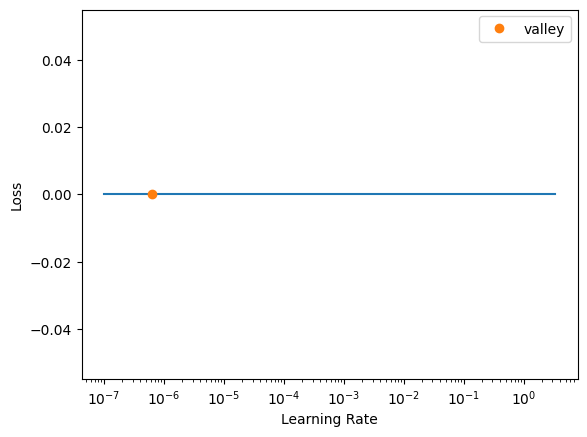

In [ ]:
learn.lr_find()

In [ ]:
flowers = DataBlock(
    blocks=(ImageBlock, CategoryBlock),
    get_items=get_image_files,
    splitter=RandomSplitter(valid_pct=0.2, seed=42),
    get_y=parent_label,  # This extracts labels from parent directory names
    item_tfms=Resize(224)
)

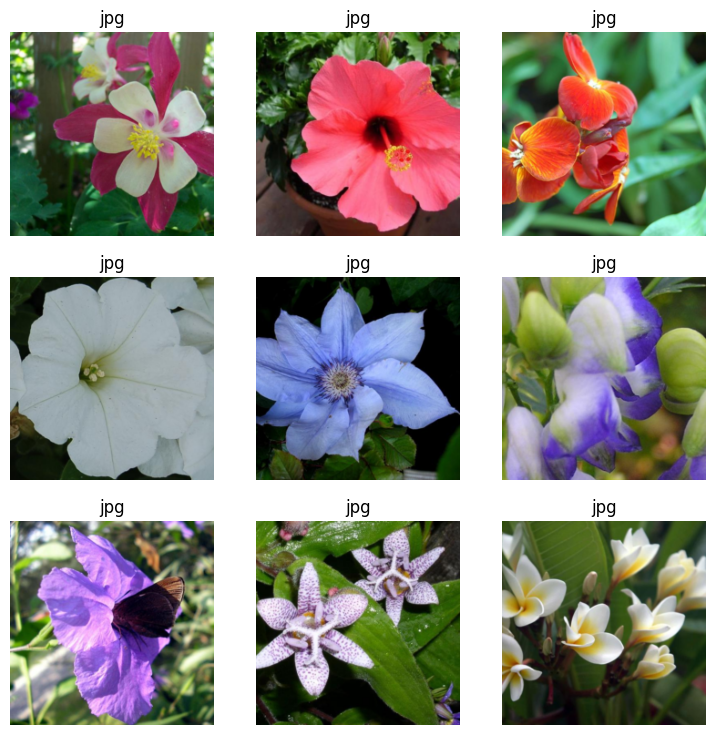

In [ ]:
dls = flowers.dataloaders(path)
dls.show_batch()

**VISION SEGMENTATION TASK**


In [ ]:
path = untar_data(URLs.CAMVID_TINY)

In [ ]:
codes = np.loadtxt(path/'codes.txt', dtype=str)

camvid = DataBlock(blocks=(ImageBlock, MaskBlock(codes)),
                   get_items=get_image_files,
                   splitter=RandomSplitter(valid_pct=0.2, seed=42),
                   get_y=lambda o: path/'labels'/f'{o.stem}_P{o.suffix}',
                   item_tfms=Resize(224),
                   batch_tfms=[*aug_transforms(size=(128, 128)), Normalize.from_stats(*imagenet_stats)])
dls = camvid.dataloaders(path/"images", bs=8)

In [ ]:
xb, yb = dls.one_batch()
print(xb.shape, yb.shape)  # Inspect the shape of the inputs and targets


torch.Size([8, 3, 128, 128]) torch.Size([8, 128, 128])


In [ ]:
learn = unet_learner(dls, resnet34, metrics=Dice)


In [ ]:
learn.fine_tune(6)


epoch,train_loss,valid_loss,dice,time
0,3.060412,2.233088,17.332618,00:03


epoch,train_loss,valid_loss,dice,time
0,1.690390,1.597651,17.017213,00:02
1,1.499079,1.309200,16.398893,00:02
2,1.382182,1.171777,17.653994,00:02
3,1.292220,1.047285,15.801002,00:02
4,1.211046,0.965448,15.833163,00:02
5,1.148411,0.944001,15.856604,00:02


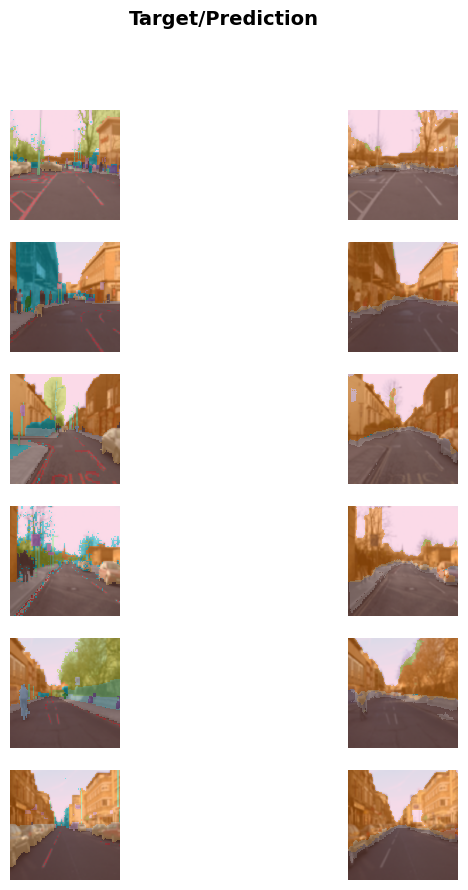

In [ ]:
learn.show_results(max_n=6, figsize=(8, 10))


**TABULAR TASK**

In [ ]:
from fastai.tabular.all import *
from sklearn.datasets import fetch_california_housing
import pandas as pd

In [ ]:
housing = fetch_california_housing()
# Convert to a pandas DataFrame
df = pd.DataFrame(housing.data, columns=housing.feature_names)
df['MedHouseVal'] = housing.target


In [ ]:
splits = RandomSplitter(valid_pct=0.2)(range_of(df))

cont_names = housing.feature_names
procs = [Categorify, FillMissing, Normalize]
to = TabularPandas(df, procs=procs, cont_names=cont_names, y_names="MedHouseVal", splits=splits)

dls = to.dataloaders(bs=64)


In [ ]:
learn = tabular_learner(dls, y_range=(0, 5), layers=[500, 100], n_out=1, loss_func=F.mse_loss)
learn.fit_one_cycle(5, 5e-3)


epoch,train_loss,valid_loss,time
0,0.443449,0.392526,00:04
1,0.395356,0.326161,00:01
2,0.380337,0.443797,00:02
3,0.355797,0.307541,00:02
4,0.331759,0.344884,00:01


In [ ]:
learn.show_results(max_n=10)


,MedInc,HouseAge,AveRooms,AveBedrms,Population,AveOccup,Latitude,Longitude,MedHouseVal,MedHouseVal_pred
0,-0.859900,0.423478,-0.211071,0.109189,0.344981,-0.035776,-0.798290,1.334131,0.71800,0.824769
1,2.977854,0.423478,0.671454,-0.124752,0.238940,-0.121086,-0.690610,0.695207,5.00001,4.609188
2,-0.236488,0.106068,-0.392890,-0.169552,-0.574331,-0.171497,-0.929379,0.834971,2.84100,2.277622
3,0.687961,-0.687458,0.320581,0.084312,-0.494581,-0.075009,0.980777,-0.942037,2.22900,1.973444
4,-0.586378,-0.052637,-0.032636,-0.129789,0.085576,0.137289,0.418966,0.086231,0.65000,0.598906
5,-1.120165,0.026715,-0.691248,0.362781,1.887392,0.320557,-0.868517,0.700199,1.40200,1.395813
6,-0.446105,0.264773,-0.225310,-0.438794,-0.846005,0.019105,0.437693,0.136146,1.09100,0.641731
7,0.289852,0.661536,-0.001000,-0.100953,-0.439370,-0.050679,-0.798290,0.620332,1.48400,2.417307
8,0.290697,-0.528753,-0.029006,-0.142654,1.567517,-0.006981,0.877777,-1.191617,2.23500,2.131103
9,-0.825043,-0.211343,-0.742994,-0.179681,0.536030,0.095242,-0.877881,0.780063,1.77700,1.667477


**Recommendation Task**

In [ ]:
import pandas as pd

ratings_path = '/content/drive/MyDrive/CMPE - 258 Deep Learning/BX-Book-Ratings.csv'
ratings = pd.read_csv(ratings_path, encoding='latin-1', sep=';')

# Preview the ratings data
ratings.head()


,User-ID,ISBN,Rating
0,276725,034545104X,0
1,276726,0155061224,5
2,276727,0446520802,0
3,276729,052165615X,3
4,276729,0521795028,6


In [ ]:
from fastai.collab import *

dls = CollabDataLoaders.from_df(ratings, user_name='User-ID', item_name='ISBN', rating_name='Book-Rating', bs=64)


In [ ]:
learn = collab_learner(dls, n_factors=50, y_range=(0, 10))
learn.fit_one_cycle(5, 5e-3)


epoch,train_loss,valid_loss,time
0,nan,None,00:55
1,nan,None,00:53
2,nan,None,00:51
3,nan,None,00:52
4,nan,None,00:50


In [ ]:
# Construct a DataFrame for the input
input_df = pd.DataFrame({'User-ID': [user_id], 'ISBN': [book_isbn]})

# View the DataFrame to confirm it looks correct
print(input_df)


  User-ID        ISBN
0  276762  3453185323


In [ ]:
from fastai.collab import *
from fastai.tabular.all import *
import pandas as pd


In [ ]:
df = pd.read_csv('/content/drive/MyDrive/CMPE - 258 Deep Learning/BX-Book-Ratings.csv', delimiter=';', encoding='latin-1')
df.head()


,User-ID,ISBN,Rating
0,276725,034545104X,0
1,276726,0155061224,5
2,276727,0446520802,0
3,276729,052165615X,3
4,276729,0521795028,6


In [ ]:
dls = CollabDataLoaders.from_df(df, user_name='User-ID', item_name='ISBN', rating_name='Rating', bs=64, valid_pct=0.2)

In [ ]:
learn = collab_learner(dls, n_factors=50, y_range=(df['Rating'].min(), df['Rating'].max()))
learn.fit_one_cycle(1, 5e-3)


epoch,train_loss,valid_loss,time
0,11.858749,12.051604,03:52


In [ ]:
learn.show_results()

,User-ID,ISBN,Rating,Rating_pred
0,52125,268351,10,7.367712
1,58832,105124,0,2.917077
2,26234,116831,0,6.842094
3,32623,82655,6,1.559777
4,1120,186999,6,5.547860
5,45930,286876,0,3.975073
6,57664,101228,0,5.165679
7,57018,275909,8,3.222926
8,37839,232319,9,5.121620


# b) Use for various tasks with hugginface transformers api for following tasks

Text classification

Named entity recognition

Question answering

Text summarization

Translation

Zero-shot classification

Computer vision

Audio

Table QA

In [ ]:
%%capture
%pip install transformers[sentencepiece]

# **Text Classification**

In [ ]:
# Following is a text from a customer expressing their experience with a food delivery service:

text = """Dear FoodFiesta, I recently ordered a vegetarian pizza from your app, expecting a delightful dinner. \
However, to my disappointment, the pizza arrived not only late but also cold. Moreover, it was topped with pepperoni, \
which as a vegetarian, I find unacceptable. This mistake ruined my dinner plans and left me quite dissatisfied with \
your service. I would appreciate it if you could address this issue promptly and ensure such mistakes are not repeated. \
I look forward to a resolution and compensation for this unsatisfactory experience. Best regards, Charlie."""

from transformers import pipeline

sentiment_analysis = pipeline('sentiment-analysis')

No model was supplied, defaulted to distilbert/distilbert-base-uncased-finetuned-sst-2-english and revision af0f99b (https://huggingface.co/distilbert/distilbert-base-uncased-finetuned-sst-2-english).
Using a pipeline without specifying a model name and revision in production is not recommended.


config.json:   0%|          | 0.00/629 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/268M [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/48.0 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

In [ ]:
sentiment_analysis(text)

[{'label': 'NEGATIVE', 'score': 0.9988504648208618}]

# **Named entity recognition**

The task involves identifying and classifying entities like organizations, locations, and individuals within the text.


In [ ]:

text = """The United Nations Climate Change Conference, hosted this year in Glasgow, Scotland, concluded with a landmark agreement among participating countries. The summit, which drew delegates from over 190 countries, aimed to accelerate efforts in combating climate change through various initiatives. Among the notable attendees were United States President Joe Biden, German Chancellor Angela Merkel, and environmental activist Greta Thunberg. The conference underscored the urgent need for global cooperation to achieve a sustainable and environmentally friendly future."""

from transformers import pipeline

# Initialize the NER pipeline
ner_pipeline = pipeline('ner')

# Apply the pipeline to the text with an aggregation strategy
entities = ner_pipeline(text, aggregation_strategy="simple")

No model was supplied, defaulted to dbmdz/bert-large-cased-finetuned-conll03-english and revision f2482bf (https://huggingface.co/dbmdz/bert-large-cased-finetuned-conll03-english).
Using a pipeline without specifying a model name and revision in production is not recommended.


config.json:   0%|          | 0.00/998 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/1.33G [00:00<?, ?B/s]

Some weights of the model checkpoint at dbmdz/bert-large-cased-finetuned-conll03-english were not used when initializing BertForTokenClassification: ['bert.pooler.dense.bias', 'bert.pooler.dense.weight']
- This IS expected if you are initializing BertForTokenClassification from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing BertForTokenClassification from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


tokenizer_config.json:   0%|          | 0.00/60.0 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/213k [00:00<?, ?B/s]

In [ ]:
for entity in entities:
    print(f"{entity['word']}: {entity['entity_group']} ({entity['score']:.2f})")

United Nations: ORG (0.75)
Climate Change Conference: MISC (0.86)
Glasgow: LOC (1.00)
Scotland: LOC (1.00)
United States: LOC (1.00)
Joe Biden: PER (1.00)
German: MISC (1.00)
Angela Merkel: PER (0.99)
Greta Thunberg: PER (1.00)


# **Question - Answering**


This involves identifying the specific part of the text that answers the posed question.


In [ ]:
text = """The Great Wall of China is one of the most extraordinary constructions of ancient engineering. Stretching over 21,000 kilometers, it was built in several stages and was primarily used for protection against invasions from the North. The wall was also a means of controlling immigration and emigration. Construction began in the 7th century BC, and the most famous sections were built during the Ming Dynasty. Despite common belief, the Great Wall cannot be seen from space with the naked eye."""

# The question we want to ask:
question = "Why was the Great Wall of China built?"

In [ ]:
from transformers import pipeline

qa_pipeline = pipeline("question-answering")

outputs = qa_pipeline(question=question, context=text)

print(outputs)

No model was supplied, defaulted to distilbert/distilbert-base-cased-distilled-squad and revision 626af31 (https://huggingface.co/distilbert/distilbert-base-cased-distilled-squad).
Using a pipeline without specifying a model name and revision in production is not recommended.


config.json:   0%|          | 0.00/473 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/261M [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/29.0 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/213k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/436k [00:00<?, ?B/s]

{'score': 0.11015702039003372, 'start': 184, 'end': 231, 'answer': 'for protection against invasions from the North'}


# **Text Summarization**

Lets move from Text classification to Text Summarization.

Here's an example of how we could use Hugging Face's `transformers` for text summarization:

In [ ]:
text = """The world of technology witnessed a monumental breakthrough today as scientists from the Global Tech Innovations Institute unveiled a new quantum computer. This computer, named Quantum Pioneer, is said to surpass the capabilities of current supercomputers by a significant margin. Quantum Pioneer utilizes a revolutionary approach to quantum bits, or qubits, enabling it to perform complex calculations at speeds unimaginable with today's technology. The implications of this advancement are vast, potentially transforming fields such as cryptography, materials science, and complex system simulation. The unveiling event showcased the Quantum Pioneer solving a complex chemical simulation problem in mere seconds, a task that would take traditional supercomputers days to complete. The scientists behind this innovation believe it will pave the way for new discoveries in various scientific domains, making previously unsolvable problems manageable. Industry experts are already predicting a seismic shift in computing power, with Quantum Pioneer leading the charge into a new era of technological capabilities."""

from transformers import pipeline

summarization = pipeline('summarization')

summary = summarization(text, max_length=130, min_length=30, do_sample=False)

No model was supplied, defaulted to sshleifer/distilbart-cnn-12-6 and revision a4f8f3e (https://huggingface.co/sshleifer/distilbart-cnn-12-6).
Using a pipeline without specifying a model name and revision in production is not recommended.


config.json:   0%|          | 0.00/1.80k [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/1.22G [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/1.22G [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/26.0 [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/899k [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/456k [00:00<?, ?B/s]

In [ ]:
print(summary[0]['summary_text'])

 Quantum Pioneer is said to surpass the capabilities of current supercomputers by a significant margin . It uses a revolutionary approach to quantum bits, or qubits, to perform complex calculations at speeds unimaginable with today's technology . The implications of this advancement are vast, potentially transforming fields such as cryptography, materials science, and complex system simulation .


# **Translation**

 If our data is in a language for which we don't have a specific model, translation is a great option.


In [ ]:
# Here, we use a translation pipeline to convert English text into French.

text = """The Northern Lights, or Aurora Borealis, are a spectacular natural phenomenon that occur in the high latitude regions. These lights are the result of collisions between electrically charged particles from the sun that enter the earth's atmosphere. The colors can vary from green to pink to purple, depending on the type of gas molecules that the particles collide with. The best time to witness this breathtaking spectacle is during the winter months in locations such as Norway, Sweden, or Alaska."""

from transformers import pipeline

translator = pipeline("translation_en_to_fr", model="Helsinki-NLP/opus-mt-en-fr")

outputs = translator(text, clean_up_tokenization_spaces=True, min_length=100)

config.json:   0%|          | 0.00/1.42k [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/301M [00:00<?, ?B/s]

generation_config.json:   0%|          | 0.00/293 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/42.0 [00:00<?, ?B/s]

source.spm:   0%|          | 0.00/778k [00:00<?, ?B/s]

target.spm:   0%|          | 0.00/802k [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/1.34M [00:00<?, ?B/s]

/usr/local/lib/python3.10/dist-packages/transformers/models/marian/tokenization_marian.py:197: UserWarning: Recommended: pip install sacremoses.
  warnings.warn("Recommended: pip install sacremoses.")


In [ ]:
from textwrap import TextWrapper
wrapper = TextWrapper(width=80)

print(wrapper.fill(outputs[0]['translation_text']))

Les lumières du Nord, ou Aurora Borealis, sont un phénomène naturel
spectaculaire qui se produit dans les régions de haute latitude. Ces lumières
sont le résultat de collisions entre les particules chargées électriquement du
soleil qui entrent dans l'atmosphère de la terre. Les couleurs peuvent varier du
vert au rose au violet, selon le type de molécules de gaz avec lesquelles les
particules entrent en collision. Le meilleur moment pour assister à ce spectacle
époustouflant est pendant les mois d'hiver dans des endroits tels que la
Norvège, la Suède ou l'Alaska.


# **Zero-shot Classification**

Zero-shot classification allows us to classify text into categories without having labeled training data for those categories.


In [ ]:
text = "The recent breakthrough in artificial intelligence has sparked debates among ethicists and technologists. The development of autonomous drones for civilian use raises questions about privacy and surveillance."
classes = ['technology', 'ethics', 'privacy', 'entertainment']

from transformers import pipeline

zero_shot_classifier = pipeline("zero-shot-classification", model="vicgalle/xlm-roberta-large-xnli-anli")

config.json:   0%|          | 0.00/734 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/2.24G [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/25.0 [00:00<?, ?B/s]

sentencepiece.bpe.model:   0%|          | 0.00/5.07M [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/150 [00:00<?, ?B/s]

In [ ]:
results = zero_shot_classifier(text, classes, multi_label=True)

print("Classification Results:")
for label, score in zip(results['labels'], results['scores']):
    print(f"{label}: {score:.4f}")

Classification Results:
technology: 0.9992
ethics: 0.9505
privacy: 0.9403
entertainment: 0.0003


# **Computer Vision**

In [ ]:
!pip install timm

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.2/2.2 MB 9.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 23.7/23.7 MB 34.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 823.6/823.6 kB 46.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 14.1/14.1 MB 40.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 731.7/731.7 MB 920.0 kB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 410.6/410.6 MB 1.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 121.6/121.6 MB 2.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.5/56.5 MB 2.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 124.2/124.2 MB 2.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 196.0/196.0 MB 2.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 166.0/166.0 MB 2.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 99.1/99.1 kB 6.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━

In [ ]:
!pip install datasets

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 510.5/510.5 kB 8.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 116.3/116.3 kB 15.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 194.1/194.1 kB 12.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 134.8/134.8 kB 16.7 MB/s eta 0:00:00


# **Audio**

In [ ]:
 from transformers import Wav2Vec2Processor, Wav2Vec2ForCTC
 from datasets import load_dataset
 import torch

 # load model and tokenizer
 processor = Wav2Vec2Processor.from_pretrained("facebook/wav2vec2-base-960h")
 model = Wav2Vec2ForCTC.from_pretrained("facebook/wav2vec2-base-960h")

 # load dummy dataset and read soundfiles
 ds = load_dataset("patrickvonplaten/librispeech_asr_dummy", "clean", split="validation")

 # tokenize
 input_values = processor(ds[0]["audio"]["array"], return_tensors="pt", padding="longest").input_values  # Batch size 1

 # retrieve logits
 logits = model(input_values).logits

 # take argmax and decode
 predicted_ids = torch.argmax(logits, dim=-1)
 transcription = processor.batch_decode(predicted_ids)


preprocessor_config.json:   0%|          | 0.00/159 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/163 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/1.60k [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/291 [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/85.0 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/378M [00:00<?, ?B/s]

Some weights of the model checkpoint at facebook/wav2vec2-base-960h were not used when initializing Wav2Vec2ForCTC: ['wav2vec2.encoder.pos_conv_embed.conv.weight_g', 'wav2vec2.encoder.pos_conv_embed.conv.weight_v']
- This IS expected if you are initializing Wav2Vec2ForCTC from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing Wav2Vec2ForCTC from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some weights of Wav2Vec2ForCTC were not initialized from the model checkpoint at facebook/wav2vec2-base-960h and are newly initialized: ['wav2vec2.encoder.pos_conv_embed.conv.parametrizations.weight.original0', 'wav2vec2.encoder.pos_conv_embed.conv.parametrizations.weight.original1', 'wav2vec2.masked_spec_embed']
You sho

Generating validation split: 0 examples [00:00, ? examples/s]

It is strongly recommended to pass the ``sampling_rate`` argument to this function. Failing to do so can result in silent errors that might be hard to debug.


# c) User Keras-NLP for various nlp tasks

Inference with a pretrained classifier

Fine tuning a pretrained backbone

Fine tuning with user-controlled preprocessing

Fine tuning a custom modes  

In [ ]:
!pip install keras-nlp

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 465.3/465.3 kB 6.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 950.8/950.8 kB 12.5 MB/s eta 0:00:00


In [ ]:
import os

os.environ["KERAS_BACKEND"] = "tensorflow"

import keras_nlp
import keras

keras.mixed_precision.set_global_policy("mixed_float16")

# **Inference with a pretrained classifier**

let's consider the task of sentiment analysis on Yelp reviews data, aiming to classify reviews as expressing a positive or negative sentiment

In [ ]:
import pandas as pd

df = pd.read_csv('/content/drive/MyDrive/CMPE - 258 Deep Learning/Datasets/yelp.csv')

print(df.head())

              business_id        date               review_id  stars  \
0  9yKzy9PApeiPPOUJEtnvkg  2011-01-26  fWKvX83p0-ka4JS3dc6E5A      5   
1  ZRJwVLyzEJq1VAihDhYiow  2011-07-27  IjZ33sJrzXqU-0X6U8NwyA      5   
2  6oRAC4uyJCsJl1X0WZpVSA  2012-06-14  IESLBzqUCLdSzSqm0eCSxQ      4   
3  _1QQZuf4zZOyFCvXc0o6Vg  2010-05-27  G-WvGaISbqqaMHlNnByodA      5   
4  6ozycU1RpktNG2-1BroVtw  2012-01-05  1uJFq2r5QfJG_6ExMRCaGw      5   

                                                text    type  \
0  My wife took me here on my birthday for breakf...  review   
1  I have no idea why some people give bad review...  review   
2  love the gyro plate. Rice is so good and I als...  review   
3  Rosie, Dakota, and I LOVE Chaparral Dog Park!!...  review   
4  General Manager Scott Petello is a good egg!!!...  review   

                  user_id  cool  useful  funny  
0  rLtl8ZkDX5vH5nAx9C3q5Q     2       5      0  
1  0a2KyEL0d3Yb1V6aivbIuQ     0       0      0  
2  0hT2KtfLiobPvh6cDC8JQg     0    

In [16]:
import pandas as pd
import os
from sklearn.model_selection import train_test_split

# Assuming the dataframe is already loaded into `df`
# Transform 'stars' into a binary 'label' column
df['label'] = df['stars'].apply(lambda x: 1 if x >= 4 else 0)

# Split the dataset into training and testing sets
train_df, test_df = train_test_split(df, test_size=0.2, random_state=42)

# Define the directory where you want to save the split datasets
base_dir = '/content/drive/MyDrive/CMPE - 258 Deep Learning/Datasets/'
train_dir = os.path.join(base_dir, 'train')
test_dir = os.path.join(base_dir, 'test')

# Create directories
for directory in [train_dir, test_dir]:
    for sentiment in ['positive', 'negative']:
        os.makedirs(os.path.join(directory, sentiment), exist_ok=True)

# Function to save reviews in the corresponding directories
def save_reviews(reviews_df, directory):
    for _, row in reviews_df.iterrows():
        sentiment = 'positive' if row['label'] == 1 else 'negative'
        filename = f"{row['review_id']}.txt"
        filepath = os.path.join(directory, sentiment, filename)
        with open(filepath, 'w') as f:
            f.write(row['text'])

# Save the reviews
save_reviews(train_df, train_dir)
save_reviews(test_df, test_dir)

In [17]:
BATCH_SIZE = 16

# Update these paths to match where you've saved your dataset
train_dir = '/content/drive/MyDrive/CMPE - 258 Deep Learning/Datasets/train'
test_dir = '/content/drive/MyDrive/CMPE - 258 Deep Learning/Datasets/test'

# Load the datasets using keras.utils.text_dataset_from_directory
yelp_train = keras.utils.text_dataset_from_directory(
    train_dir,
    batch_size=BATCH_SIZE,
    label_mode='binary'  # Assuming binary classification (positive, negative)
)
yelp_test = keras.utils.text_dataset_from_directory(
    test_dir,
    batch_size=BATCH_SIZE,
    label_mode='binary'  # Assuming binary classification (positive, negative)
)

# Inspect the first review from the training set
for text_batch, label_batch in yelp_train.take(1):
    for i in range(1):
        print("Review:", text_batch.numpy()[i])
        print("Label:", label_batch.numpy()[i])

# Initialize a pretrained classifier from keras_nlp
classifier = keras_nlp.models.BertClassifier.from_preset("bert_tiny_en_uncased_sst2")

# Evaluate the classifier on the Yelp dataset
result = classifier.evaluate(yelp_test)
print(f"Loss: {result[0]}, Accuracy: {result[1]}")


Found 8000 files belonging to 2 classes.
Found 2000 files belonging to 2 classes.
Review: b"Excellent customer service, super clean, and the food's not bad at all.  Despite the fact that I asked for extra mayo on my sammy, but got NO mayo, was a little annoying.  But, for some reason, something told me to pick up some packets of mayo.  So I was in the clear and my annoyance never gained traction into anything that prevented me from returning.  That, and the sandwich was pretty yummo.  They also give a pickle and a free bag of chips to go with it.\n\nI do not, however, recommend the chocolate chip cookie.  No bueno."
Label: [1.]
125/125 ━━━━━━━━━━━━━━━━━━━━ 148s 1s/step - loss: 0.7666 - sparse_categorical_accuracy: 0.6522
Loss: 0.7808653116226196, Accuracy: 0.6474999785423279


In [18]:
review_text = ["I love the energy of this place! The food was amazing and service outstanding."]
prediction = classifier.predict(review_text)

predicted_label = "Positive" if prediction[0][1] > prediction[0][0] else "Negative"
print(f"Predicted sentiment: {predicted_label}")

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
Predicted sentiment: Positive


# **Fine tuning a pretrained backbone**

In [ ]:
import keras_nlp
import tensorflow as tf

# Load a pretrained BERT backbone for fine-tuning
# Specify 'num_classes=2' for binary classification (positive, negative sentiment)
classifier = keras_nlp.models.BertClassifier.from_preset(
    "bert_tiny_en_uncased",
    num_classes=2,
)

# Compile the model with default settings
# You can customize the optimizer, loss, and metrics if needed
classifier.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=5e-5),
    loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
    metrics=[tf.keras.metrics.SparseCategoricalAccuracy(name="accuracy")]
)

# Fine-tune the classifier on the Yelp dataset
history = classifier.fit(
    yelp_train,
    validation_data=yelp_test,
    epochs=1
)

100%|██████████| 507/507 [00:00<00:00, 1.27MB/s]
100%|██████████| 16.8M/16.8M [00:02<00:00, 7.02MB/s]
100%|██████████| 547/547 [00:00<00:00, 338kB/s]
100%|██████████| 226k/226k [00:00<00:00, 309kB/s]


500/500 ━━━━━━━━━━━━━━━━━━━━ 70s 75ms/step - accuracy: 0.6904 - loss: 0.5913 - val_accuracy: 0.8165 - val_loss: 0.4139


# **Fine tuning with user-controlled preprocessing**

To fine-tune a BERT model with user-controlled preprocessing on the Yelp dataset, we'll follow the advanced scenario outlined.

 This involves using direct control over preprocessing to handle inputs in a more customized manner, which can be beneficial for certain training scenarios, such as when dealing with large datasets or requiring custom preprocessing steps.

Initialize the Preprocessor

In [ ]:
preprocessor = keras_nlp.models.BertPreprocessor.from_preset(
    "bert_tiny_en_uncased",
    sequence_length=512,
)

Preprocess the Dataset

In [ ]:
yelp_train_processed = (
    yelp_train.map(lambda x, y: (preprocessor(x), y), num_parallel_calls=tf.data.AUTOTUNE)
    .cache()
    .prefetch(tf.data.AUTOTUNE)
)
yelp_test_processed = (
    yelp_test.map(lambda x, y: (preprocessor(x), y), num_parallel_calls=tf.data.AUTOTUNE)
    .cache()
    .prefetch(tf.data.AUTOTUNE)
)

Load and Fine-tune the Classifier

In [ ]:
classifier = keras_nlp.models.BertClassifier.from_preset(
    "bert_tiny_en_uncased", preprocessor=None, num_classes=2
)

# Fine-tune the classifier
classifier.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=5e-5),
    loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
    metrics=[tf.keras.metrics.SparseCategoricalAccuracy(name="accuracy")]
)
classifier.fit(
    yelp_train_processed,
    validation_data=yelp_test_processed,
    epochs=3,
)

Epoch 1/3
500/500 ━━━━━━━━━━━━━━━━━━━━ 85s 98ms/step - accuracy: 0.6878 - loss: 0.6008 - val_accuracy: 0.8175 - val_loss: 0.4177
Epoch 2/3
500/500 ━━━━━━━━━━━━━━━━━━━━ 8s 16ms/step - accuracy: 0.8126 - loss: 0.4150 - val_accuracy: 0.8460 - val_loss: 0.3621
Epoch 3/3
500/500 ━━━━━━━━━━━━━━━━━━━━ 6s 13ms/step - accuracy: 0.8669 - loss: 0.3260 - val_accuracy: 0.8465 - val_loss: 0.3679


**Custom Preprocessing Scenario**

In [ ]:
tokenizer = keras_nlp.tokenizers.BertTokenizer.from_preset("bert_tiny_en_uncased")

# Example of tokenizing two sentences
tokenized_texts = tokenizer(["I love modular workflows!", "Libraries over frameworks!"])

# Using a packer to pad tokenized sequences
packer = keras_nlp.layers.MultiSegmentPacker(
    start_value=tokenizer.cls_token_id,
    end_value=tokenizer.sep_token_id,
    sequence_length=64,
)

# Packing the tokenized texts
packed_inputs = packer(tokenized_texts)

# **Fine tuning with a custom model**

In [ ]:
preprocessor_url = "https://tfhub.dev/tensorflow/bert_en_uncased_preprocess/3"
encoder_url = "https://tfhub.dev/tensorflow/small_bert/bert_en_uncased_L-2_H-128_A-2/2"

bert_preprocessor = hub.KerasLayer(preprocessor_url)
bert_encoder = hub.KerasLayer(encoder_url, trainable=False)  # Freeze the backbone
!pip uninstall -y tensorflow tensorflow-text tensorflow-hub

Found existing installation: tensorflow 2.15.0
Uninstalling tensorflow-2.15.0:
  Successfully uninstalled tensorflow-2.15.0
Found existing installation: tensorflow-hub 0.16.1
Uninstalling tensorflow-hub-0.16.1:
  Successfully uninstalled tensorflow-hub-0.16.1


In [ ]:
!pip install tensorflow==2.16.1 tensorflow-text==2.16.1 tensorflow-hub==0.12.0

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 589.8/589.8 MB 1.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.2/5.2 MB 53.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 108.8/108.8 kB 12.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.8/4.8 MB 26.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.2/2.2 MB 56.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.5/5.5 MB 31.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 47.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 286.8/286.8 kB 18.6 MB/s eta 0:00:00
  Attempting uninstall: ml-dtypes
    Found existing installation: ml-dtypes 0.2.0
    Uninstalling ml-dtypes-0.2.0:
      Successfully uninstalled ml-dtypes-0.2.0
  Attempting uninstall: h5py
    Found existing installation: h5py 3.9.0
    Uninstalling h5py-3.9.0:
      Successfully uninstalled h5py-3.9.0
  Attempting uninstall: tensorboard
    Found exi

In [ ]:
!pip install --upgrade tensorflow tensorflow-hub tensorflow-text

INFO: pip is looking at multiple versions of tf-keras to determine which version is compatible with other requirements. This could take a while.
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 8.9 MB/s eta 0:00:00
  Attempting uninstall: tf-keras
    Found existing installation: tf_keras 2.15.1
    Uninstalling tf_keras-2.15.1:
      Successfully uninstalled tf_keras-2.15.1
  Attempting uninstall: tensorflow-hub
    Found existing installation: tensorflow-hub 0.12.0
    Uninstalling tensorflow-hub-0.12.0:
      Successfully uninstalled tensorflow-hub-0.12.0


In [ ]:
import tensorflow as tf
import tensorflow_hub as hub
import tensorflow_text as text

In [ ]:
preprocessor_url = "https://tfhub.dev/tensorflow/bert_en_uncased_preprocess/3"
encoder_url = "https://tfhub.dev/tensorflow/small_bert/bert_en_uncased_L-2_H-128_A-2/2"

bert_preprocessor = hub.KerasLayer(preprocessor_url)
bert_encoder = hub.KerasLayer(encoder_url, trainable=False)  # Freeze the backbone

In [20]:
def preprocess_data(text, label):
    return bert_preprocessor(text), label

yelp_train_preprocessed = yelp_train.map(preprocess_data).cache().prefetch(tf.data.AUTOTUNE)
yelp_test_preprocessed = yelp_test.map(preprocess_data).cache().prefetch(tf.data.AUTOTUNE)

In [ ]:
# Define URLs for BERT preprocessor and encoder
preprocessor_url = "https://tfhub.dev/tensorflow/bert_en_uncased_preprocess/3"
encoder_url = "https://tfhub.dev/tensorflow/small_bert/bert_en_uncased_L-2_H-128_A-2/2"

# Load the BERT preprocessor and encoder from TensorFlow Hub
bert_preprocessor = hub.KerasLayer(preprocessor_url)
bert_encoder = hub.KerasLayer(encoder_url, trainable=True)  # Set trainable to True or False based on your need

# Define the model architecture
text_input = tf.keras.layers.Input(shape=(), dtype=tf.string, name='text')
preprocessed_text = bert_preprocessor(text_input)
encoder_outputs = bert_encoder(preprocessed_text)

# Example: Using pooled_output for classification tasks
pooled_output = encoder_outputs['pooled_output']
x = tf.keras.layers.Dropout(0.1)(pooled_output)
x = tf.keras.layers.Dense(1, activation='sigmoid')(x)  # Adjust the output layer based on your task

# Construct and compile the model
model = tf.keras.Model(inputs=[text_input], outputs=[x])
model.compile(optimizer='adam',
              loss='binary_crossentropy',  # Or another loss function as per your task
              metrics=['accuracy'])

# D) User Keras-CV for various vision tasks


Object detection using YOLO model

Inference with a pretrained classifier

Fine-tuning a pretrained backbone

Training a image classifier from scratch

train custom object detection model

In [24]:
!pip install -q --upgrade keras-cv
!pip install -q --upgrade keras

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 613.1/613.1 kB 3.7 MB/s eta 0:00:00


In [27]:
import os

os.environ["KERAS_BACKEND"] = "tensorflow"  # @param ["tensorflow", "jax", "torch"]

from tensorflow import data as tf_data
import tensorflow_datasets as tfds
import keras
import keras_cv
import numpy as np
from keras_cv import bounding_box
import os
from keras_cv import visualization
import tqdm

# **Object detection using YOLO model**

In [28]:
pretrained_model = keras_cv.models.YOLOV8Detector.from_preset(
    "yolo_v8_m_pascalvoc", bounding_box_format="xywh"
)

100%|██████████| 2.27k/2.27k [00:00<00:00, 3.18MB/s]
100%|██████████| 99.5M/99.5M [00:01<00:00, 75.5MB/s]


163759/163759 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


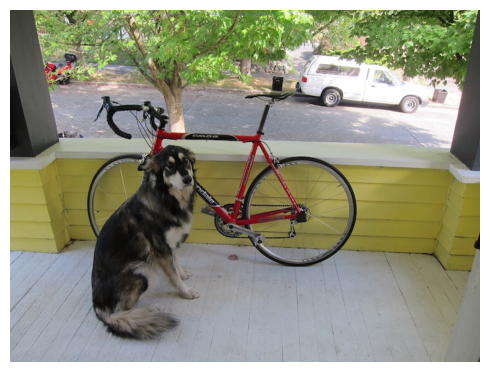

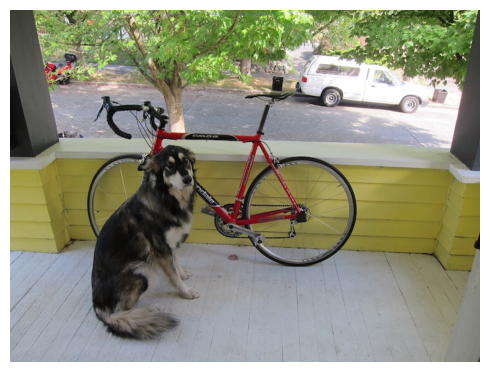

In [32]:
filepath = keras.utils.get_file(origin="https://djl.ai/examples/src/test/resources/dog_bike_car.jpg")
image = keras.utils.load_img(filepath)
image = np.array(image)

visualization.plot_image_gallery(
    np.array([image]),
    value_range=(0, 255),
    rows=1,
    cols=1,
    scale=5,
)

In [33]:
inference_resizing = keras_cv.layers.Resizing(
    640, 640, pad_to_aspect_ratio=True, bounding_box_format="xywh"
)

In [46]:

# Assuming `image` is loaded as shown previously and might be in uint8 format
# Convert `image` to float32
image_float32 = tf.image.convert_image_dtype(image, dtype=tf.float32)

# Now, `image_float32` is ready and can be processed by the resizing layer
# Note: The conversion scales the image's pixel values to the range [0, 1]
inference_resizing = keras_cv.layers.Resizing(
    640, 640, pad_to_aspect_ratio=True, bounding_box_format="xywh"
)

# Prepare the image for batch processing (add a batch dimension)
image_batch = tf.expand_dims(image_float32, axis=0)


# Proceed with your model prediction...


In [49]:
def resize_and_pad_image(image, target_size=(640, 640), pad_value=0):
    # Compute aspect ratio resize dimensions
    original_shape = tf.cast(tf.shape(image)[:2], dtype=tf.float32)
    ratio = target_size[0] / tf.reduce_max(original_shape)
    new_shape = tf.round(original_shape * ratio)
    resized_image = tf.image.resize(image, tf.cast(new_shape, dtype=tf.int32))

    # Pad to target size
    pad_height = target_size[0] - new_shape[0]
    pad_width = target_size[1] - new_shape[1]
    pad_top = pad_height // 2
    pad_bottom = pad_height - pad_top
    pad_left = pad_width // 2
    pad_right = pad_width - pad_left
    padded_image = tf.pad(resized_image, [[pad_top, pad_bottom], [pad_left, pad_right], [0, 0]], constant_values=pad_value)

    return padded_image

# Convert the image to float32 if not already
image_float32 = tf.cast(image, dtype=tf.float32) / 255.0  # Assuming image is in uint8
image_batch = tf.expand_dims(image_float32, axis=0)  # Add batch dimension

# Manually resize and pad
image_batch_resized = resize_and_pad_image(image_batch[0], target_size=(640, 640))
image_batch_resized = tf.expand_dims(image_batch_resized, axis=0)  # Re-add batch dimension for model input


In [48]:
from tensorflow.keras.mixed_precision import global_policy

print("Current dtype policy:", global_policy().name)  # Check the current global dtype policy

# If it's set to 'mixed_float16', you might consider disabling it temporarily:
# from tensorflow.keras.mixed_precision import set_global_policy
# set_global_policy('float32')


Current dtype policy: mixed_float16


In [53]:
from tensorflow.keras.mixed_precision import set_global_policy
set_global_policy('float32')


In [54]:
from tensorflow.keras.mixed_precision import global_policy
print("Current dtype policy:", global_policy().name)


Current dtype policy: float32


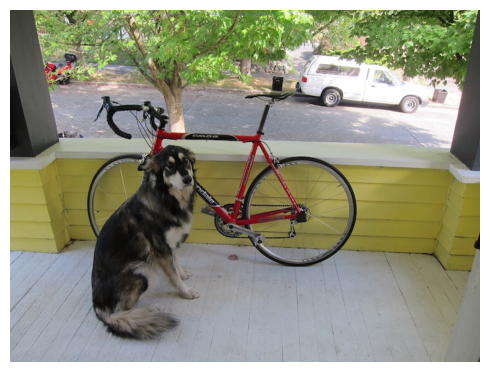

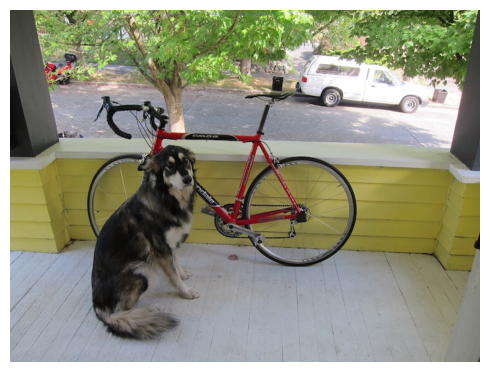

In [63]:
filepath = keras.utils.get_file(origin="https://djl.ai/examples/src/test/resources/dog_bike_car.jpg")
image = keras.utils.load_img(filepath)
image = np.array(image)

visualization.plot_image_gallery(
    np.array([image]),
    value_range=(0, 255),
    rows=1,
    cols=1,
    scale=5,
)

In [64]:
inference_resizing = keras_cv.layers.Resizing(
    640, 640, pad_to_aspect_ratio=True, bounding_box_format="xywh"
)

In [65]:
image_batch = inference_resizing([image])

In [66]:
class_ids = [
    "Aeroplane",
    "Bicycle",
    "Bird",
    "Boat",
    "Bottle",
    "Bus",
    "Car",
    "Cat",
    "Chair",
    "Cow",
    "Dining Table",
    "Dog",
    "Horse",
    "Motorbike",
    "Person",
    "Potted Plant",
    "Sheep",
    "Sofa",
    "Train",
    "Tvmonitor",
    "Total",
]
class_mapping = dict(zip(range(len(class_ids)), class_ids))

1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step


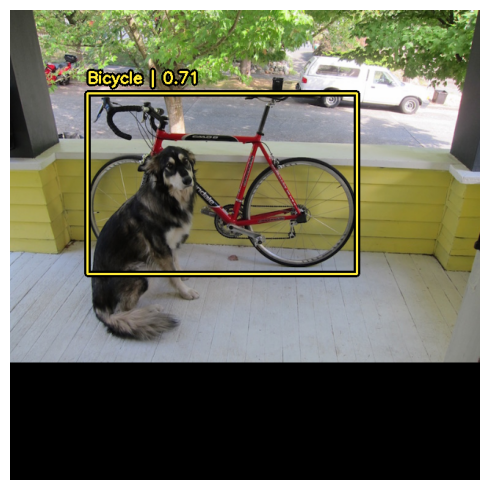

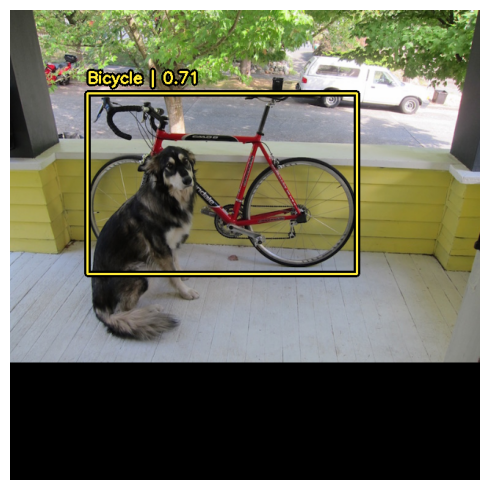

In [67]:
y_pred = pretrained_model.predict(image_batch)
# y_pred is a bounding box Tensor:
# {"classes": ..., boxes": ...}
visualization.plot_bounding_box_gallery(
    image_batch,
    value_range=(0, 255),
    rows=1,
    cols=1,
    y_pred=y_pred,
    scale=5,
    font_scale=0.7,
    bounding_box_format="xywh",
    class_mapping=class_mapping,
)

1/1 ━━━━━━━━━━━━━━━━━━━━ 11s 11s/step


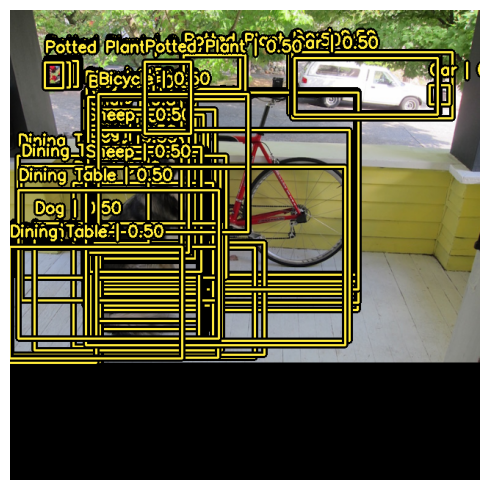

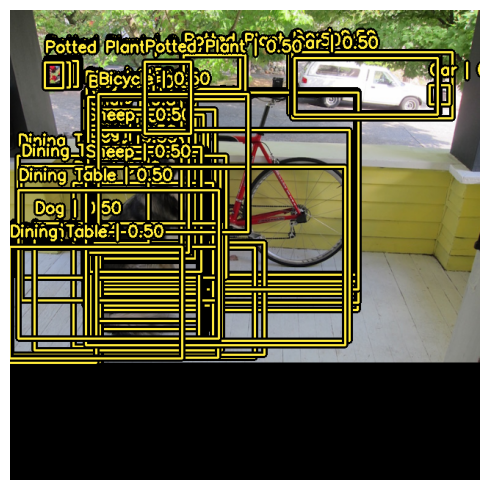

In [68]:
# The following NonMaxSuppression layer is equivalent to disabling the operation
prediction_decoder = keras_cv.layers.NonMaxSuppression(
    bounding_box_format="xywh",
    from_logits=True,
    iou_threshold=1.0,
    confidence_threshold=0.0,
)
pretrained_model = keras_cv.models.YOLOV8Detector.from_preset(
    "yolo_v8_m_pascalvoc",
    bounding_box_format="xywh",
    prediction_decoder=prediction_decoder,
)

y_pred = pretrained_model.predict(image_batch)
visualization.plot_bounding_box_gallery(
    image_batch,
    value_range=(0, 255),
    rows=1,
    cols=1,
    y_pred=y_pred,
    scale=5,
    font_scale=0.7,
    bounding_box_format="xywh",
    class_mapping=class_mapping,
)

# **Training a custom object detection model**

In [89]:
BATCH_SIZE = 4

In [90]:

def visualize_dataset(inputs, value_range, rows, cols, bounding_box_format):
    inputs = next(iter(inputs.take(1)))
    images, bounding_boxes = inputs["images"], inputs["bounding_boxes"]
    visualization.plot_bounding_box_gallery(
        images,
        value_range=value_range,
        rows=rows,
        cols=cols,
        y_true=bounding_boxes,
        scale=5,
        font_scale=0.7,
        bounding_box_format=bounding_box_format,
        class_mapping=class_mapping,
    )


def unpackage_raw_tfds_inputs(inputs, bounding_box_format):
    image = inputs["image"]
    boxes = keras_cv.bounding_box.convert_format(
        inputs["objects"]["bbox"],
        images=image,
        source="rel_yxyx",
        target=bounding_box_format,
    )
    bounding_boxes = {
        "classes": inputs["objects"]["label"],
        "boxes": boxes,
    }
    return {"images": image, "bounding_boxes": bounding_boxes}


def load_pascal_voc(split, dataset, bounding_box_format):
    ds = tfds.load(dataset, split=split, with_info=False, shuffle_files=True)
    ds = ds.map(
        lambda x: unpackage_raw_tfds_inputs(x, bounding_box_format=bounding_box_format),
        num_parallel_calls=tf_data.AUTOTUNE,
    )
    return ds


train_ds = load_pascal_voc(
    split="train", dataset="voc/2007", bounding_box_format="xywh"
)
eval_ds = load_pascal_voc(split="test", dataset="voc/2007", bounding_box_format="xywh")

train_ds = train_ds.shuffle(BATCH_SIZE * 4)

Dl Completed...: 0 url [00:00, ? url/s]

Dl Size...: 0 MiB [00:00, ? MiB/s]

Extraction completed...: 0 file [00:00, ? file/s]

Generating splits...:   0%|          | 0/3 [00:00<?, ? splits/s]

Generating test examples...:   0%|          | 0/4952 [00:00<?, ? examples/s]

Shuffling /root/tensorflow_datasets/voc/2007/4.0.0.incomplete2R81PS/voc-test.tfrecord*...:   0%|          | 0/…

Generating train examples...:   0%|          | 0/2501 [00:00<?, ? examples/s]

Shuffling /root/tensorflow_datasets/voc/2007/4.0.0.incomplete2R81PS/voc-train.tfrecord*...:   0%|          | 0…

Generating validation examples...:   0%|          | 0/2510 [00:00<?, ? examples/s]

Shuffling /root/tensorflow_datasets/voc/2007/4.0.0.incomplete2R81PS/voc-validation.tfrecord*...:   0%|        …

Dataset voc downloaded and prepared to /root/tensorflow_datasets/voc/2007/4.0.0. Subsequent calls will reuse this data.


In [91]:
train_ds = train_ds.ragged_batch(BATCH_SIZE, drop_remainder=True)
eval_ds = eval_ds.ragged_batch(BATCH_SIZE, drop_remainder=True)

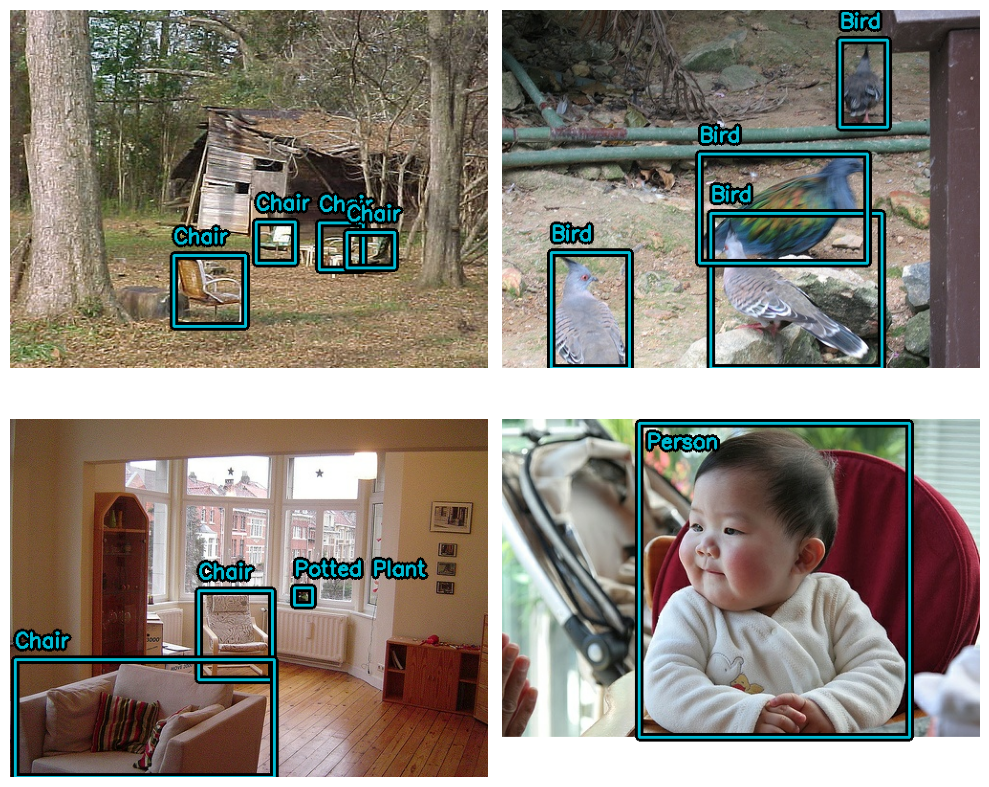

In [92]:
visualize_dataset(
    train_ds, bounding_box_format="xywh", value_range=(0, 255), rows=2, cols=2
)

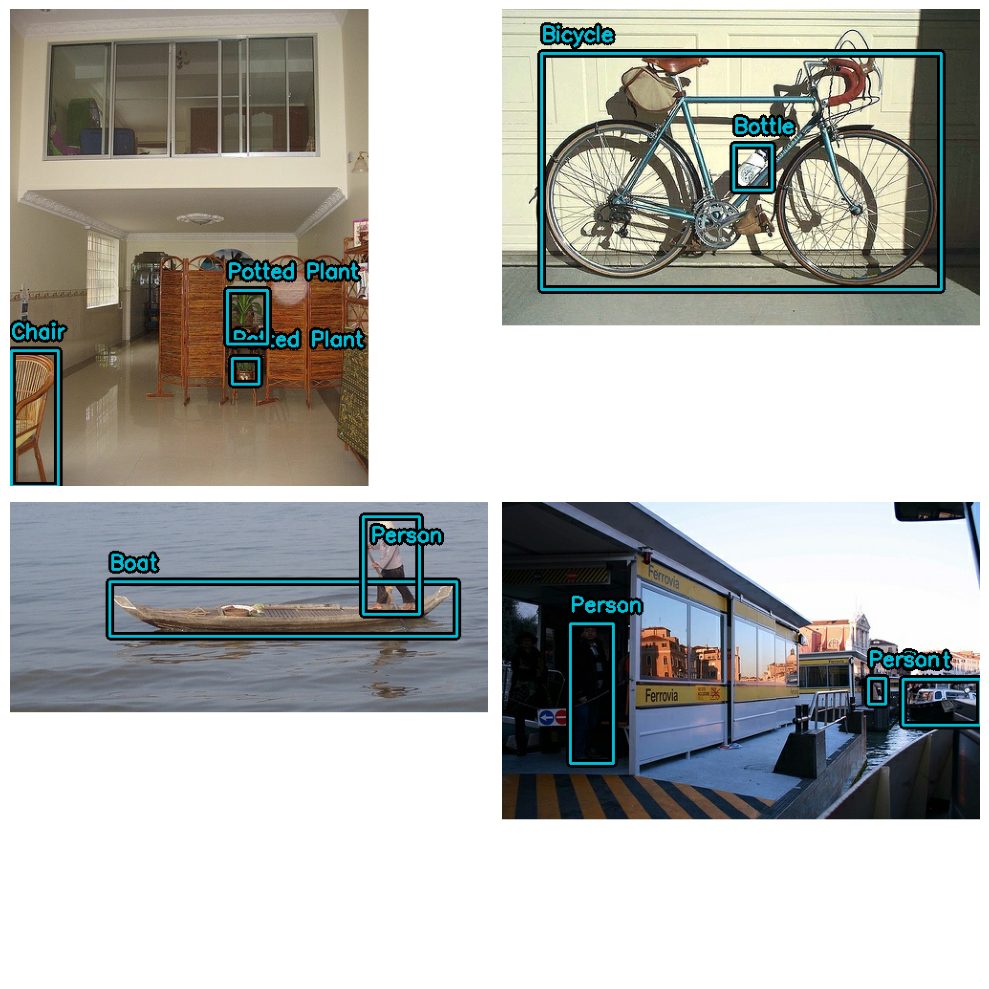

In [93]:
visualize_dataset(
    eval_ds,
    bounding_box_format="xywh",
    value_range=(0, 255),
    rows=2,
    cols=2,
    # If you are not running your experiment on a local machine, you can also
    # make `visualize_dataset()` dump the plot to a file using `path`:
    # path="eval.png"
)

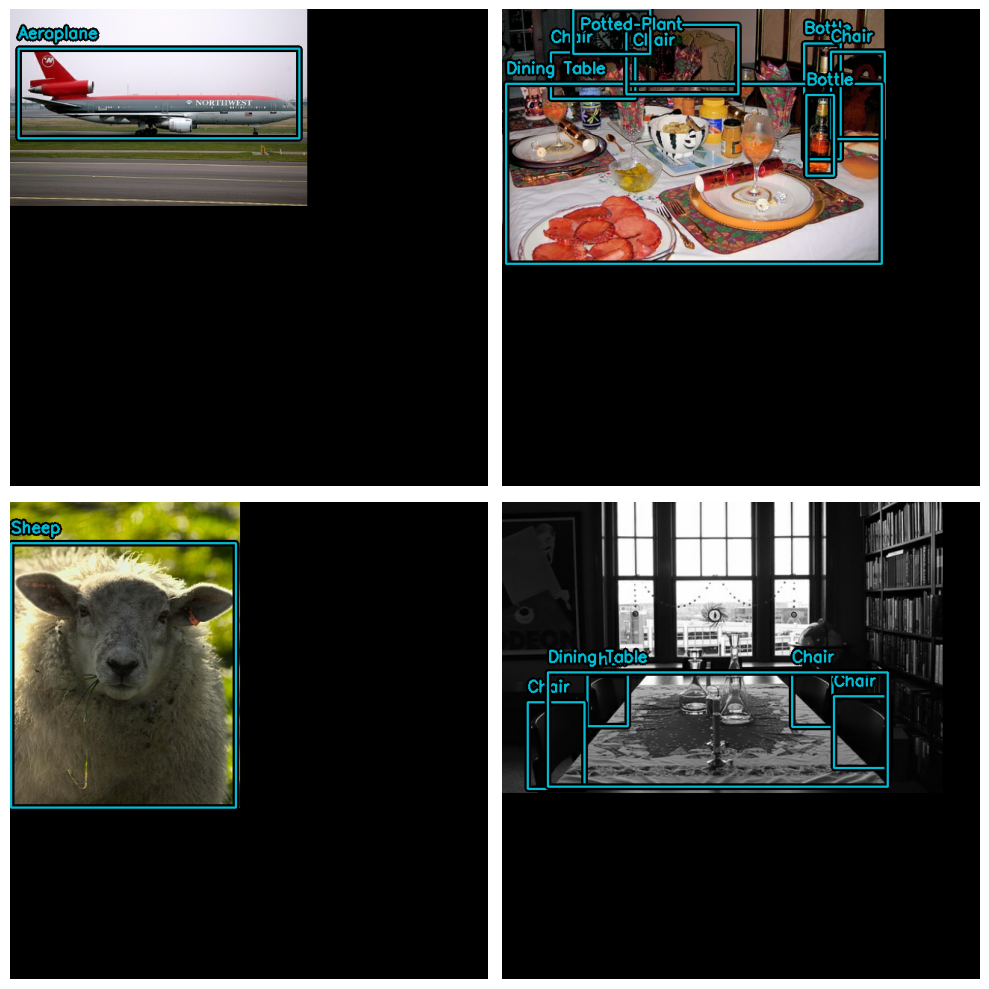

In [94]:
augmenters = [
    keras_cv.layers.RandomFlip(mode="horizontal", bounding_box_format="xywh"),
    keras_cv.layers.JitteredResize(
        target_size=(640, 640), scale_factor=(0.75, 1.3), bounding_box_format="xywh"
    ),
]


def create_augmenter_fn(augmenters):
    def augmenter_fn(inputs):
        for augmenter in augmenters:
            inputs = augmenter(inputs)
        return inputs

    return augmenter_fn


augmenter_fn = create_augmenter_fn(augmenters)

train_ds = train_ds.map(augmenter_fn, num_parallel_calls=tf_data.AUTOTUNE)
visualize_dataset(
    train_ds, bounding_box_format="xywh", value_range=(0, 255), rows=2, cols=2
)

In [95]:
inference_resizing = keras_cv.layers.Resizing(
    640, 640, bounding_box_format="xywh", pad_to_aspect_ratio=True
)
eval_ds = eval_ds.map(inference_resizing, num_parallel_calls=tf_data.AUTOTUNE)

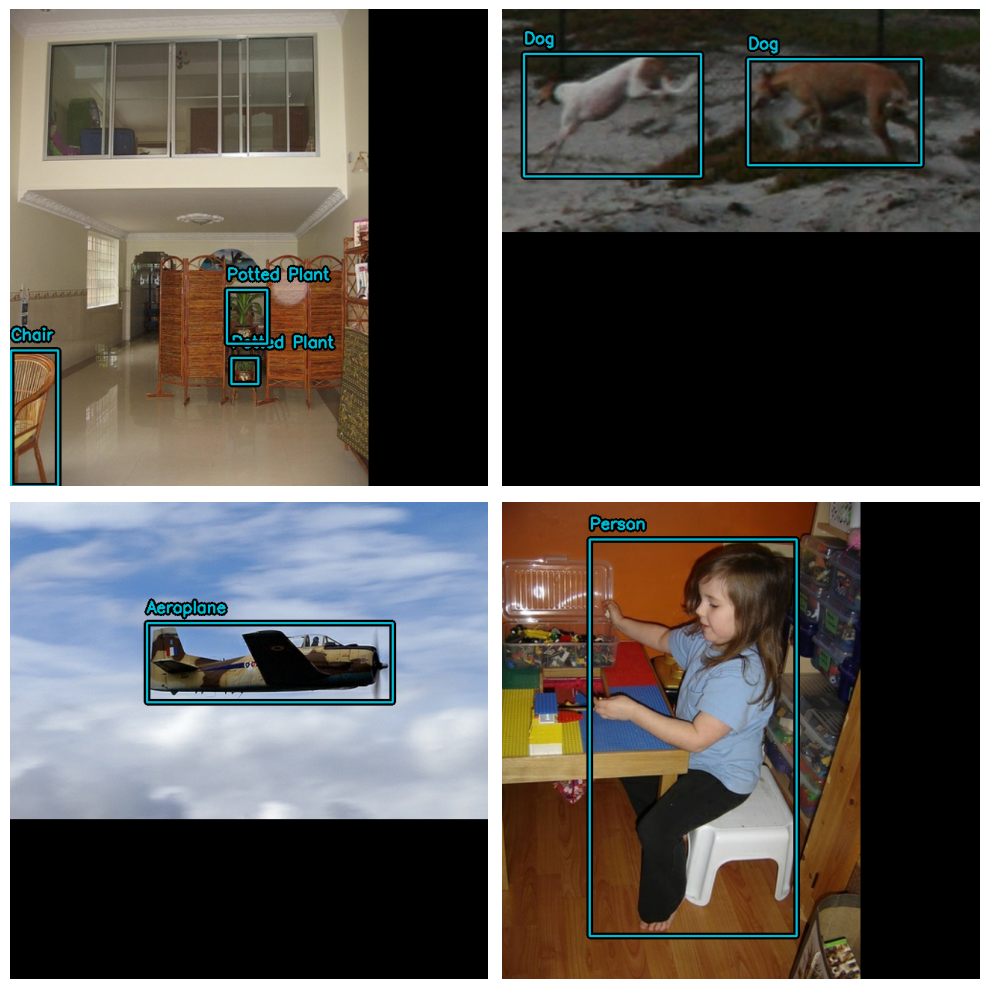

In [96]:
visualize_dataset(
    eval_ds, bounding_box_format="xywh", value_range=(0, 255), rows=2, cols=2
)

In [97]:

def dict_to_tuple(inputs):
    return inputs["images"], bounding_box.to_dense(
        inputs["bounding_boxes"], max_boxes=32
    )


train_ds = train_ds.map(dict_to_tuple, num_parallel_calls=tf_data.AUTOTUNE)
eval_ds = eval_ds.map(dict_to_tuple, num_parallel_calls=tf_data.AUTOTUNE)

train_ds = train_ds.prefetch(tf_data.AUTOTUNE)
eval_ds = eval_ds.prefetch(tf_data.AUTOTUNE)

In [98]:
base_lr = 0.005
# including a global_clipnorm is extremely important in object detection tasks
optimizer = keras.optimizers.SGD(
    learning_rate=base_lr, momentum=0.9, global_clipnorm=10.0
)

In [99]:
pretrained_model.compile(
    classification_loss="binary_crossentropy",
    box_loss="ciou",
)

In [100]:
coco_metrics_callback = keras_cv.callbacks.PyCOCOCallback(
    eval_ds.take(20), bounding_box_format="xywh"
)

In [101]:
model = keras_cv.models.YOLOV8Detector.from_preset(
    "resnet50_imagenet",
    # For more info on supported bounding box formats, visit
    # https://keras.io/api/keras_cv/bounding_box/
    bounding_box_format="xywh",
    num_classes=20,
)

100%|██████████| 777/777 [00:00<00:00, 1.20MB/s]
100%|██████████| 90.3M/90.3M [00:00<00:00, 123MB/s]


In [102]:
model.compile(
    classification_loss="binary_crossentropy",
    box_loss="ciou",
    optimizer=optimizer,
)

In [105]:
model.fit(
    train_ds.take(1),
    # Run for 10-35~ epochs to achieve good scores.
    epochs=1,
    callbacks=[coco_metrics_callback],
)

20/20 ━━━━━━━━━━━━━━━━━━━━ 588s 29s/step
creating index...
index created!
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.46s).
Accumulating evaluation results...
DONE (t=0.21s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.000
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.002
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.006
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.006
 Average Recall     (AR) @[ IoU=0.50:0.95 

In [106]:
model = keras_cv.models.YOLOV8Detector.from_preset(
    "yolo_v8_m_pascalvoc", bounding_box_format="xywh"
)

In [107]:
visualization_ds = eval_ds.unbatch()
visualization_ds = visualization_ds.ragged_batch(16)
visualization_ds = visualization_ds.shuffle(8)

In [109]:
def visualize_detections(model, dataset, bounding_box_format):
    images, y_true = next(iter(dataset.take(1)))
    y_pred = model.predict(images)
    visualization.plot_bounding_box_gallery(
        images,
        value_range=(0, 255),
        bounding_box_format=bounding_box_format,
        y_true=y_true,
        y_pred=y_pred,
        scale=4,
        rows=2,
        cols=2,
        show=True,
        font_scale=0.7,
        class_mapping=class_mapping,
    )

1/1 ━━━━━━━━━━━━━━━━━━━━ 39s 39s/step


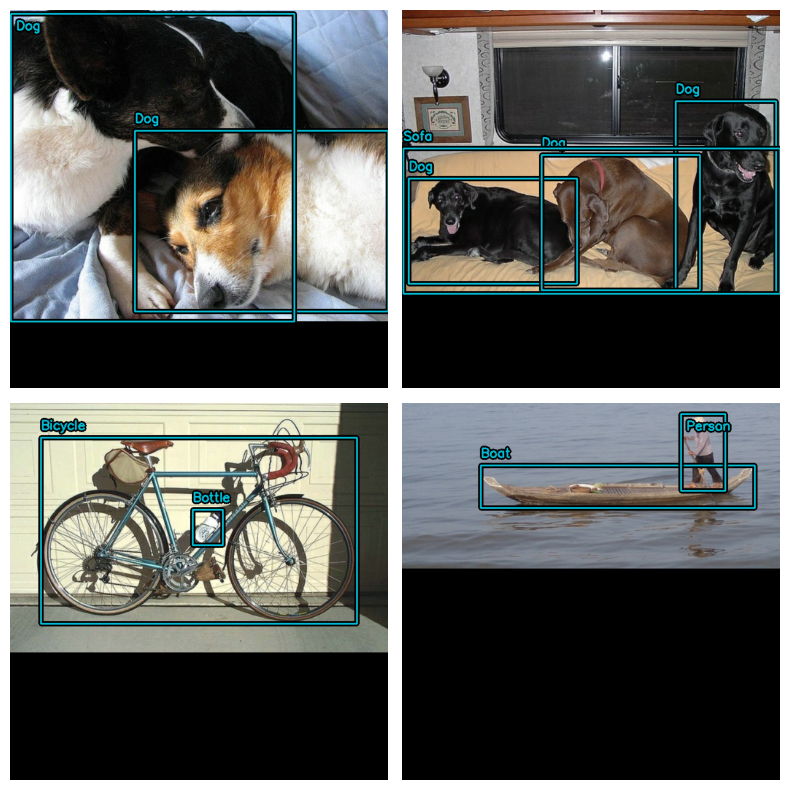

In [110]:
model.prediction_decoder = keras_cv.layers.NonMaxSuppression(
    bounding_box_format="xywh",
    from_logits=True,
    iou_threshold=0.5,
    confidence_threshold=0.75,
)

visualize_detections(model, dataset=visualization_ds, bounding_box_format="xywh")

# **Training an image classifier from scratch**

In [2]:
!pip install keras-cv


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 613.1/613.1 kB 4.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 950.8/950.8 kB 8.3 MB/s eta 0:00:00


In [3]:
import tensorflow as tf
from tensorflow.keras import layers, models
import keras_cv


Using TensorFlow backend


In [4]:
from tensorflow.keras.datasets import cifar10

# Load the CIFAR-10 dataset
(train_images, train_labels), (test_images, test_labels) = cifar10.load_data()

# Normalize pixel values to be between 0 and 1
train_images, test_images = train_images / 255.0, test_images / 255.0

170498071/170498071 [==============================] - 4s 0us/step


In [5]:
model = models.Sequential([
    # Note: In a real-world scenario, you'd adjust the architecture based on your specific dataset and requirements
    layers.Conv2D(32, (3, 3), activation='relu', input_shape=(32, 32, 3)),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(64, (3, 3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(64, (3, 3), activation='relu'),
    layers.Flatten(),
    layers.Dense(64, activation='relu'),
    layers.Dense(10)  # 10 classes
])


In [6]:
model.compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])

In [8]:
history = model.fit(train_images, train_labels, epochs=3,
                    validation_data=(test_images, test_labels))

Epoch 1/3
1563/1563 [==============================] - 78s 50ms/step - loss: 1.3170 - accuracy: 0.5273 - val_loss: 1.1842 - val_accuracy: 0.5771
Epoch 2/3
1563/1563 [==============================] - 78s 50ms/step - loss: 1.0812 - accuracy: 0.6184 - val_loss: 1.0450 - val_accuracy: 0.6297
Epoch 3/3
1563/1563 [==============================] - 71s 46ms/step - loss: 0.9599 - accuracy: 0.6601 - val_loss: 0.9669 - val_accuracy: 0.6615


In [9]:
test_loss, test_acc = model.evaluate(test_images,  test_labels, verbose=2)
print('\nTest accuracy:', test_acc)

313/313 - 5s - loss: 0.9669 - accuracy: 0.6615 - 5s/epoch - 16ms/step

Test accuracy: 0.6614999771118164


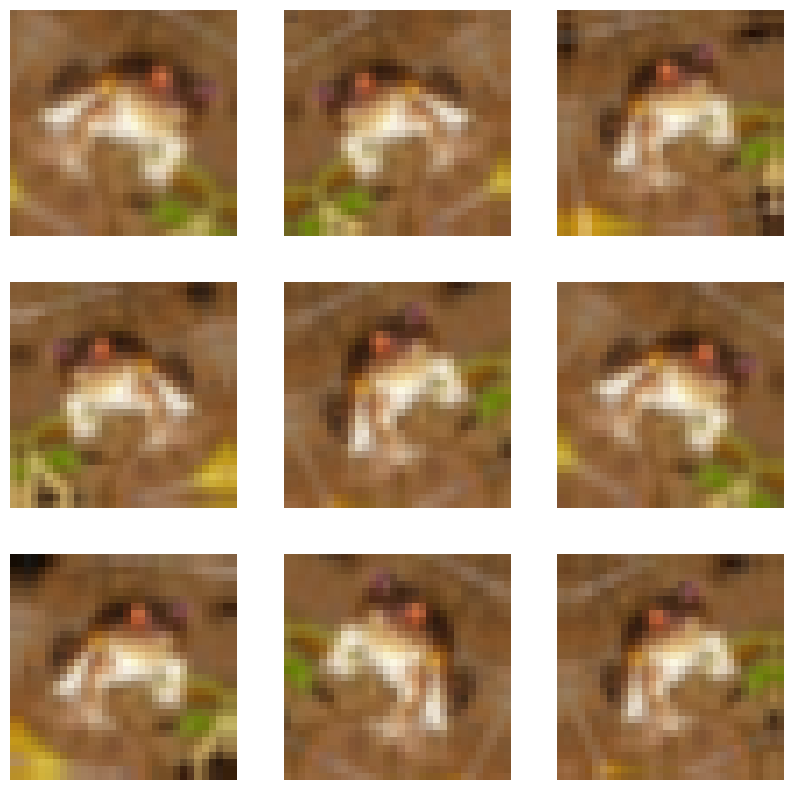

In [11]:
from tensorflow.keras import layers, models

# Define a Sequential model for data augmentation
data_augmentation = models.Sequential([
    layers.RandomFlip("horizontal", input_shape=(32, 32, 3)),
    layers.RandomRotation(0.1),
    layers.RandomZoom(0.1),
])

# You can visualize some augmented images by applying the data_augmentation model to some training images
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 10))
for i in range(9):
    augmented_image = data_augmentation(train_images[:1])
    ax = plt.subplot(3, 3, i + 1)
    plt.imshow(augmented_image[0])
    plt.axis("off")

In [13]:
print(train_labels.shape)
print(test_labels.shape)

(50000, 1)
(10000, 1)


In [15]:
import numpy as np

In [16]:
# If your labels are one-hot encoded, convert them to integer class labels
train_labels = np.argmax(train_labels, axis=1)
test_labels = np.argmax(test_labels, axis=1)

# If your labels have an extra singleton dimension, you can use np.squeeze to remove it
train_labels = np.squeeze(train_labels)
test_labels = np.squeeze(test_labels)
